In [47]:
import os
from skimage import io
from skimage.transform import resize
import numpy as np
from skimage.feature import hog, local_binary_pattern
from skimage.filters import gabor
import cv2
import matplotlib.pyplot as plt
import mahotas 
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances
from skimage.feature import graycomatrix, graycoprops
import os
from skimage import io
from skimage.transform import resize
import numpy as np
from skimage.feature import hog, local_binary_pattern
from skimage.filters import gabor
import cv2
import matplotlib.pyplot as plt
import mahotas 
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances
from skimage.feature import graycomatrix, graycoprops
import torch
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import timm
from transformers import ViTImageProcessor, ViTModel

<h2>Defining descriptors

In [2]:
def extract_pixel_intensity(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    pixel_intensity = image_resized.mean(axis=(0, 1))  
    return pixel_intensity


In [4]:
def extract_sift(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:  
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    sift = cv2.SIFT_create()
    
    kp, des = sift.detectAndCompute(image_gray, None)
    
    if des is None:
        return np.zeros(128)
    
    return des.flatten()[:128]

In [6]:

def extract_hog(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3: 
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    # Extract HOG features
    hog_features, _ = hog(
        image_gray, 
        pixels_per_cell=(8, 8), 
        cells_per_block=(2, 2), 
        visualize=True
    )
    
    return hog_features


In [8]:

def extract_lbp(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2: 
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    lbp = local_binary_pattern(image_gray, P=8, R=1, method='uniform')
    
    lbp_hist = np.histogram(lbp.ravel(), bins=np.arange(0, 11), range=(0, 10))[0]
    
    lbp_hist = lbp_hist.astype("float")
    lbp_hist /= (lbp_hist.sum() + 1e-6)
    
    return lbp_hist


In [10]:

def extract_haralick(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:  
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    haralick_features = mahotas.features.haralick(image_gray).mean(axis=0)
    
    contrast, homogeneity = haralick_features[1], haralick_features[8]
    
    return np.array([contrast, homogeneity])


In [12]:
def extract_gabor(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:  
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    gabor_features = []
    for frequency in (0.1, 0.3, 0.5, 0.7, 1.0):  
        real, _ = gabor(image_gray, frequency=frequency)
        gabor_features.append(real.mean())
    
    return np.array(gabor_features)


In [14]:
from skimage.morphology import skeletonize

def skeleton_descriptor(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2: 
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    
    skeleton = skeletonize(image_gray > 128)
    
    skeleton_fraction = np.sum(skeleton) / skeleton.size
    
    return np.array([skeleton_fraction])


In [16]:
from skimage.feature import graycomatrix, graycoprops

def glcm_descriptor(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:  
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    glcm = graycomatrix(image_gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    
    return np.array([contrast, homogeneity])


In [18]:
def extract_first_order_statistics(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2:  
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    mean_intensity = np.mean(image_gray)
    std_intensity = np.std(image_gray)
    
    return np.array([mean_intensity, std_intensity])


In [20]:
def extract_projection(image):
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    
    if len(image_resized.shape) == 2: 
        image_gray = (image_resized * 255).astype(np.uint8)
    elif len(image_resized.shape) == 3:  
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    else:
        raise ValueError("Unexpected image shape: {}".format(image_resized.shape))
    
    horizontal_projection = np.sum(image_gray, axis=1)  # Sum over rows
    vertical_projection = np.sum(image_gray, axis=0)    # Sum over columns
    
    horizontal_projection = horizontal_projection / np.sum(horizontal_projection)
    vertical_projection = vertical_projection / np.sum(vertical_projection)
    
    return np.concatenate([horizontal_projection, vertical_projection])


<h3>Distance matrix dependinng on the descriptor

In [48]:
import torch
import numpy as np

def compute_distance_matrix(images, descriptor_function, feature_size=128):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    features = []
    for image in images:
        try:
            feature = descriptor_function(image)

            if isinstance(feature, np.float64) or np.isscalar(feature):
                feature = [feature]

            feature = np.array(feature)

            if feature.size < feature_size:
                feature = np.pad(feature, (0, feature_size - feature.size), mode='constant')
            elif feature.size > feature_size:
                feature = feature[:feature_size]

            features.append(feature)
        except Exception as e:
            print(f"Error processing image: {e}")
            features.append([0] * feature_size)

    features_tensor = torch.tensor(features, dtype=torch.float32, device=device)

    distance_matrix = torch.cdist(features_tensor, features_tensor, p=2)
    return distance_matrix


In [49]:
def display_distance_matrix(distance_matrix, title):
    if isinstance(distance_matrix, torch.Tensor):
        distance_matrix = distance_matrix.cpu().numpy()
    plt.imshow(distance_matrix, cmap='hot', interpolation='nearest')
    plt.colorbar()
    plt.title(title)
    plt.show()


<h3>Puting the images in a list fpr readibility 

In [2]:
food_directory = 'archive/training/food'
non_food_directory = 'archive/training/non_food'

food_image_paths = [os.path.join(food_directory, filename) for filename in os.listdir(food_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_images = [io.imread(image_path) for image_path in food_image_paths]

non_food_image_paths = [os.path.join(non_food_directory, filename) for filename in os.listdir(non_food_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_images = [io.imread(image_path) for image_path in non_food_image_paths]

image_paths = food_image_paths + non_food_image_paths
images = food_images + non_food_images


<h2>Calculating the distance matrix for each descriptor

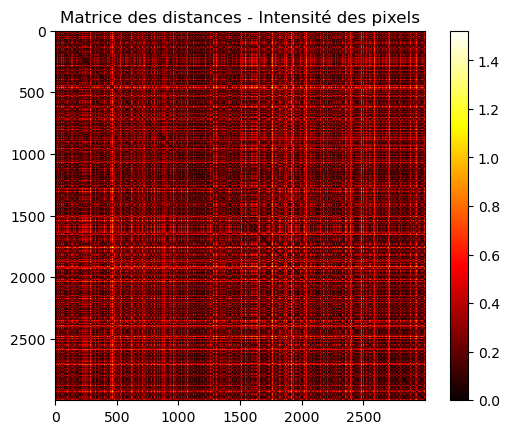

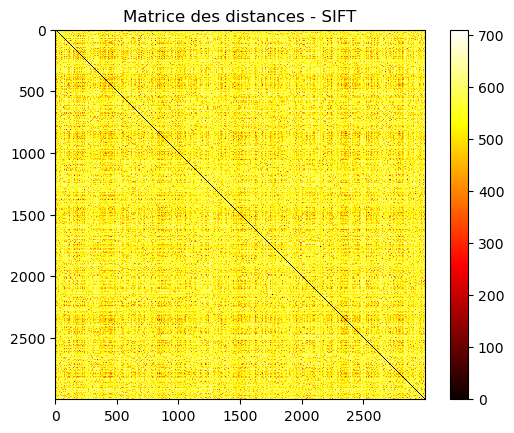

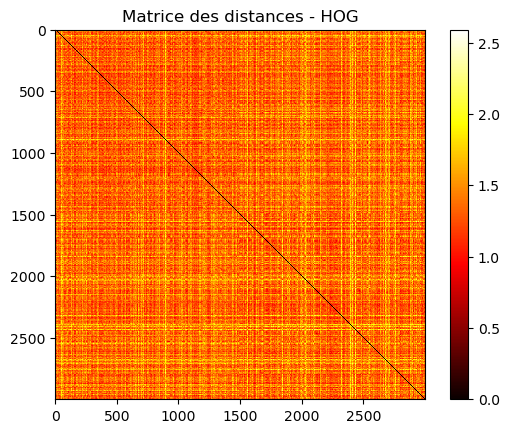

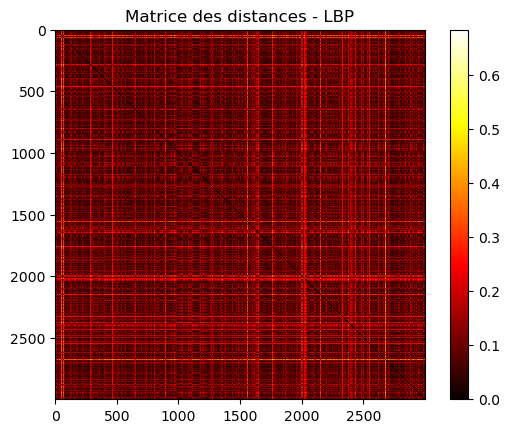

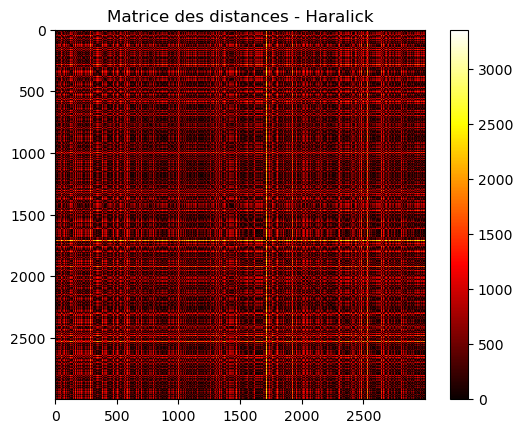

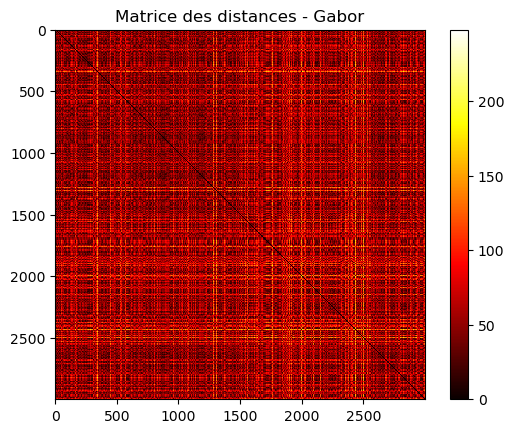

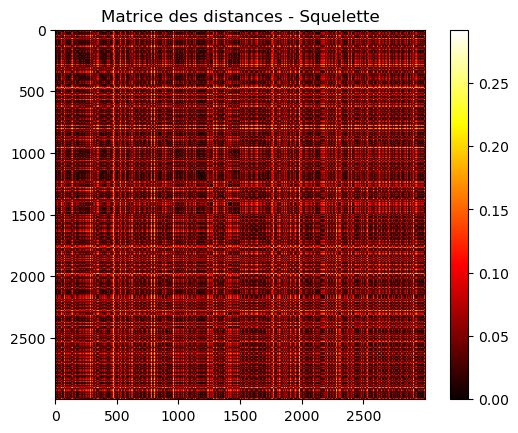

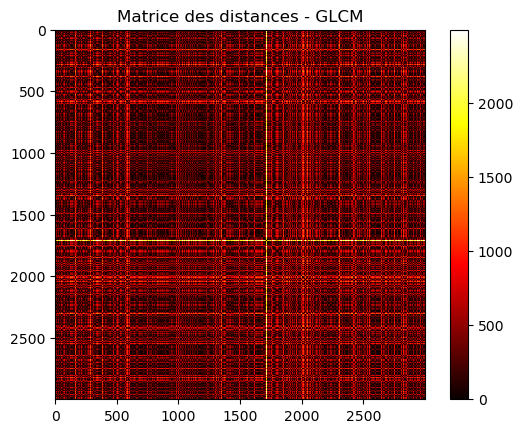

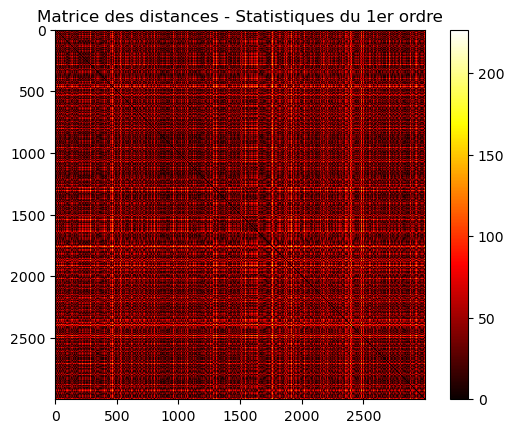

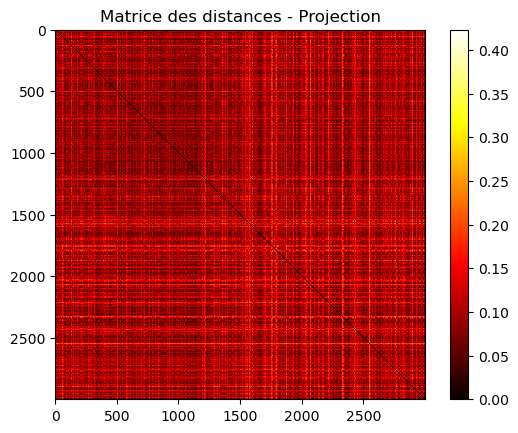

In [31]:
for descriptor_function, name in zip([extract_pixel_intensity, extract_sift, extract_hog, extract_lbp, extract_haralick, extract_gabor,skeleton_descriptor,glcm_descriptor,extract_first_order_statistics,extract_projection],
                                      ['Intensité des pixels', 'SIFT', 'HOG', 'LBP', 'Haralick', 'Gabor','Squelette','GLCM','Statistiques du 1er ordre','Projection']):
    distance_matrix = compute_distance_matrix(images, descriptor_function)
    display_distance_matrix(distance_matrix, f"Matrice des distances - {name}")


<h2>We try with merging these descriptors

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def extract_features(image):
    pixel_intensity = extract_pixel_intensity(image)  
    lbp_hist = extract_lbp(image)  
    haralick_features = extract_haralick(image) 
    gabor_features = extract_gabor(image)  
    skeleton_features = skeleton_descriptor(image) 
    glcm_features = glcm_descriptor(image) 
    first_order_features = extract_first_order_statistics(image)  
    projecions = extract_projection(image)
    features = np.hstack([pixel_intensity, lbp_hist, haralick_features, gabor_features, skeleton_features, glcm_features, first_order_features, projecions])

    return features


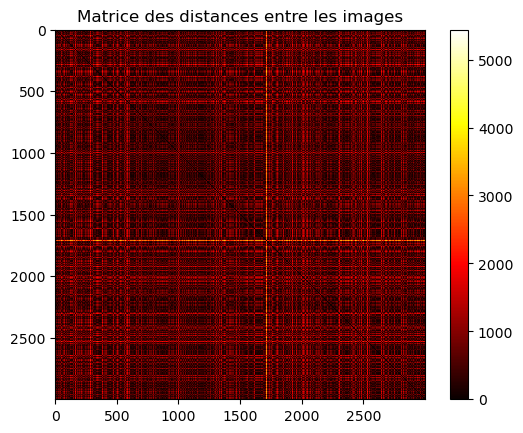

In [33]:
distance_matrix = compute_distance_matrix(images, extract_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
import numpy as np
import cv2

def extract_resnet50_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = resnet50(pretrained=True)
    model = model.eval()  
    model = torch.nn.Sequential(*list(model.children())[:-1])  
    model = model.to(device) 

    # Define preprocessing transforms
    preprocess = transforms.Compose([
        transforms.ToPILImage(), 
        transforms.Resize((224, 224)), 
        transforms.ToTensor(),  
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  
    ])

    # Preprocess the image
    img_tensor = preprocess(img)
    img_tensor = img_tensor.unsqueeze(0)  
    img_tensor = img_tensor.to(device) 

    with torch.no_grad():
        features = model(img_tensor)

    feat = features.view(-1).cpu().numpy() 
    return feat


/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]


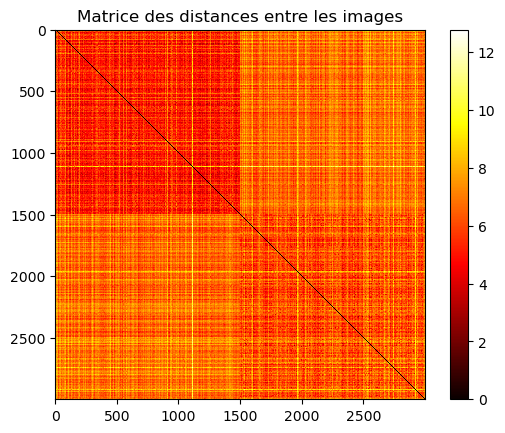

In [35]:
distance_matrix = compute_distance_matrix(images, extract_resnet50_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
from torchvision.models import densenet121

def extract_densenet121_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = densenet121(pretrained=True)
    model = model.eval()  
    model = torch.nn.Sequential(*list(model.children())[:-1])  
    model = model.to(device)  

    # Define preprocessing transforms
    preprocess = transforms.Compose([
        transforms.ToPILImage(),  
        transforms.Resize((224, 224)), 
        transforms.ToTensor(),  
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  
    ])

    # Preprocess the image
    img_tensor = preprocess(img)
    img_tensor = img_tensor.unsqueeze(0)  
    img_tensor = img_tensor.to(device) 

    # Extract features
    with torch.no_grad():
        features = model(img_tensor)

    feat = features.view(-1).cpu().numpy()  
    return feat

/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]


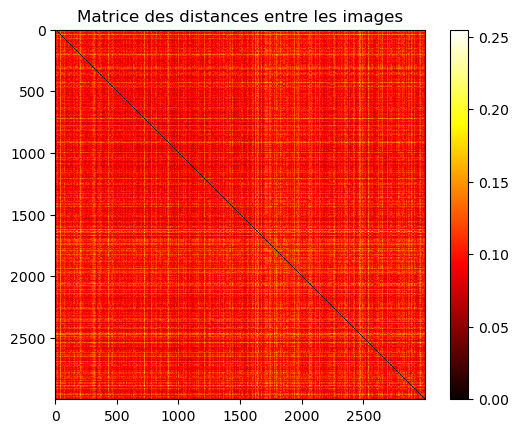

In [38]:
distance_matrix = compute_distance_matrix(images, extract_densenet121_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
import torch
from transformers import ViTModel, ViTFeatureExtractor
import numpy as np
import cv2

def extract_vit_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = ViTModel.from_pretrained("google/vit-base-patch16-224")
    model = model.eval()  
    model = model.to(device)  

    feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

    inputs = feature_extractor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}  

    # Extract features
    with torch.no_grad():
        outputs = model(**inputs)

    last_hidden_state = outputs.last_hidden_state

    features = last_hidden_state.mean(dim=1).squeeze(0).cpu().numpy()
    return features


2025-02-23 21:44:12.842622: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-23 21:44:12.975837: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740343453.035026    4941 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740343453.053882    4941 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-23 21:44:13.182762: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly i

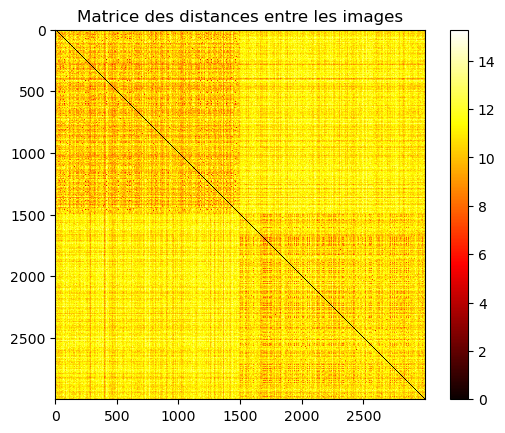

In [6]:
distance_matrix = compute_distance_matrix(images, extract_vit_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
import torch
from transformers import CLIPModel, CLIPProcessor
import numpy as np

def extract_clip_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
    model.eval()  
    model.to(device)  

    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()} 

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)

    features = features.squeeze(0).cpu().numpy()
    return features


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


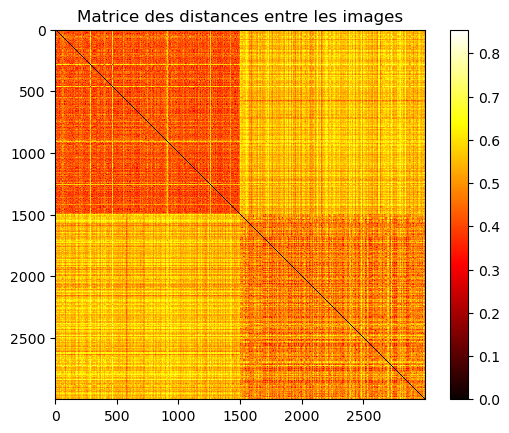

In [18]:
distance_matrix = compute_distance_matrix(images, extract_clip_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
import torch
from transformers import CLIPModel, CLIPProcessor
import numpy as np

def extract_openclip_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = CLIPModel.from_pretrained("laion/CLIP-ViT-H-14-laion2B-s32B-b79K")
    model.eval()  
    model.to(device) 

    processor = CLIPProcessor.from_pretrained("laion/CLIP-ViT-H-14-laion2B-s32B-b79K")

    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}  

    # Extract features
    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)

    features = features.squeeze(0).cpu().numpy()
    return features


config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.94G [00:00<?, ?B/s]

2025-01-25 20:01:03.260787: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-25 20:01:03.388910: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737831663.440810   19361 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737831663.456992   19361 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-25 20:01:03.583152: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


/tmp/ipykernel_19361/169261835.py:27: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  features_tensor = torch.tensor(features, dtype=torch.float32, device=device)


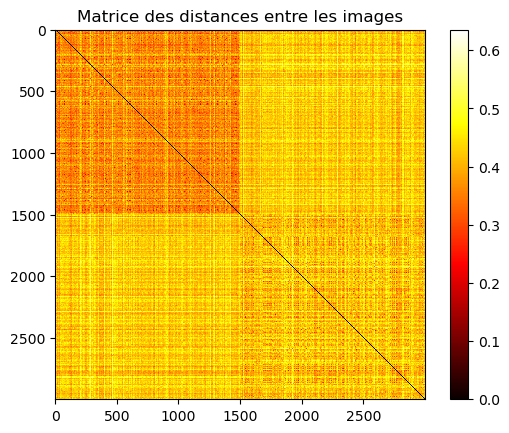

In [6]:
distance_matrix = compute_distance_matrix(images, extract_openclip_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
from transformers import Dinov2Model, AutoImageProcessor
import torch
import numpy as np

def extract_dinov2_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = Dinov2Model.from_pretrained("facebook/dinov2-large")
    model.eval()  
    model.to(device)  

    processor = AutoImageProcessor.from_pretrained("facebook/dinov2-large")

    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}  

    # Extract features
    with torch.no_grad():
        outputs = model(**inputs)

    pooled_features = outputs.pooler_output

    features = pooled_features.squeeze(0).cpu().numpy()
    return features


config.json:   0%|          | 0.00/549 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


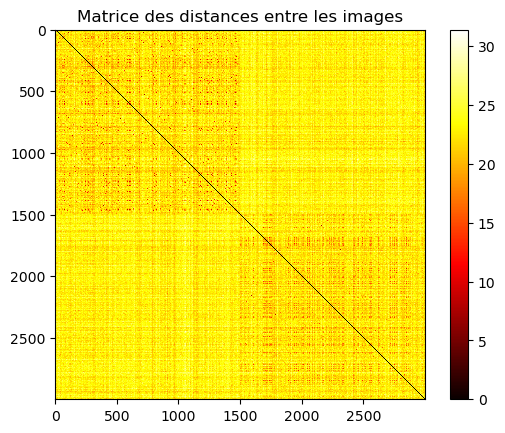

In [9]:
distance_matrix = compute_distance_matrix(images, extract_dinov2_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
from transformers import AutoFeatureExtractor, SwinModel
import torch

def extract_swin_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = SwinModel.from_pretrained("microsoft/swin-tiny-patch4-window7-224").to(device)
    feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/swin-tiny-patch4-window7-224")

    inputs = feature_extractor(images=img, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
    features = outputs.last_hidden_state.mean(dim=1).squeeze(0).cpu().numpy() 
    return features


config.json:   0%|          | 0.00/71.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/113M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


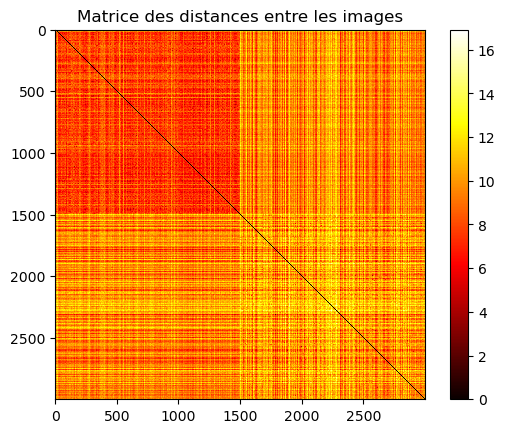

In [15]:
distance_matrix = compute_distance_matrix(images, extract_swin_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [ ]:
import torch
from transformers import CLIPModel, CLIPProcessor
import numpy as np

def extract_clipLarge_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")    
    model.eval()  
    model.to(device)  

    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}  

    # Extrayez les caractéristiques
    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)

    features = features.squeeze(0).cpu().numpy()
    return features


config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

2025-01-29 00:04:59.508548: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-29 00:04:59.635806: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738105499.687861   15493 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738105499.707571   15493 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-29 00:04:59.834223: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


/tmp/ipykernel_15493/169261835.py:27: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  features_tensor = torch.tensor(features, dtype=torch.float32, device=device)


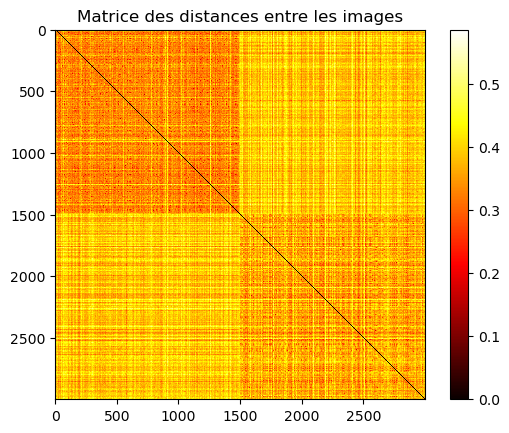

In [6]:
distance_matrix = compute_distance_matrix(images, extract_clipLarge_features)

display_distance_matrix(distance_matrix, "Matrice des distances entre les images")


In [9]:
def extract_inceptionV3_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = timm.create_model('inception_v3', pretrained=True, features_only=True)
    model = model.eval().to(device) 

    preprocess = transforms.Compose([
        transforms.ToPILImage(),  
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    img_tensor = preprocess(img).unsqueeze(0).to(device) 

    with torch.no_grad():
        features = model(img_tensor)[-1]

    feat = features.view(-1).cpu().numpy()  
    return feat


In [10]:
def extract_efficientnet_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = timm.create_model('efficientnet_b0', pretrained=True)
    model = model.eval()  # Mode évaluation
    model = torch.nn.Sequential(*list(model.children())[:-1]) 
    model = model.to(device) 

    preprocess = transforms.Compose([
        transforms.ToPILImage(),  
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) 
    ])

    img_tensor = preprocess(img)
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.to(device) 

    with torch.no_grad():
        features = model(img_tensor)

    feat = features.view(-1).cpu().numpy()  
    return feat


In [12]:
def extract_vit_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model_name = "google/vit-base-patch16-224"
    processor = ViTImageProcessor.from_pretrained(model_name)
    model = ViTModel.from_pretrained(model_name, add_pooling_layer=False).to(device)
    model.eval() 

    img_tensor = processor(images=img, return_tensors="pt")["pixel_values"].to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        features = outputs.last_hidden_state 

    feat = features.view(-1).cpu().numpy()
    return feat


In [13]:
def extract_resnet101_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = models.resnet101(pretrained=True)
    model.fc = torch.nn.Identity()
    model = model.eval().to(device)

    preprocess = transforms.Compose([
        transforms.ToPILImage(),  
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    img_tensor = preprocess(img).unsqueeze(0).to(device) 

    with torch.no_grad():
        features = model(img_tensor)

    feat = features.view(-1).cpu().numpy()
    return feat

C:\Users\Antoine BOURGEOIS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Antoine BOURGEOIS\.cache\huggingface\hub\models--timm--efficientnet_b0.ra_in1k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(mess

Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]


C:\Users\Antoine BOURGEOIS\AppData\Local\Temp\ipykernel_1596\2288914671.py:24: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  features_tensor = torch.tensor(features, dtype=torch.float32, device=device)


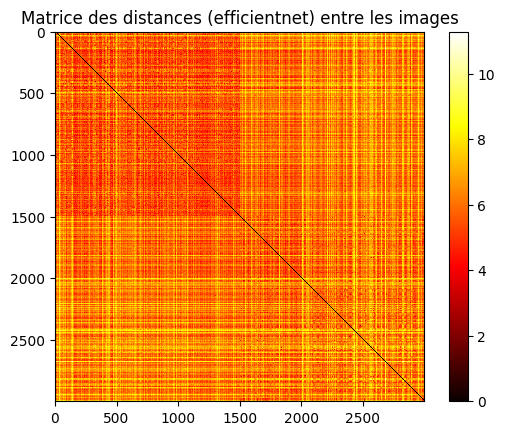

In [7]:
distance_matrix = compute_distance_matrix(images, extract_efficientnet_features)

display_distance_matrix(distance_matrix, "Matrice des distances (efficientnet) entre les images")

Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.
Error processing image: Invalid image shape. Expected either 4 or 3 dimensions, but got 2 dimensions.


C:\Users\Antoine BOURGEOIS\AppData\Local\Temp\ipykernel_5232\2288914671.py:24: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  features_tensor = torch.tensor(features, dtype=torch.float32, device=device)


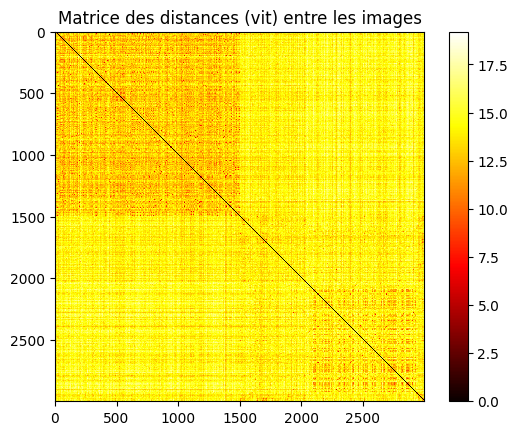

In [8]:
distance_matrix = compute_distance_matrix(images, extract_vit_features)

display_distance_matrix(distance_matrix, "Matrice des distances (vit) entre les images")

C:\Users\Antoine BOURGEOIS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Antoine BOURGEOIS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to C:\Users\Antoine BOURGEOIS/.cache\torch\hub\checkpoints\resnet101-63fe2227.p

Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]


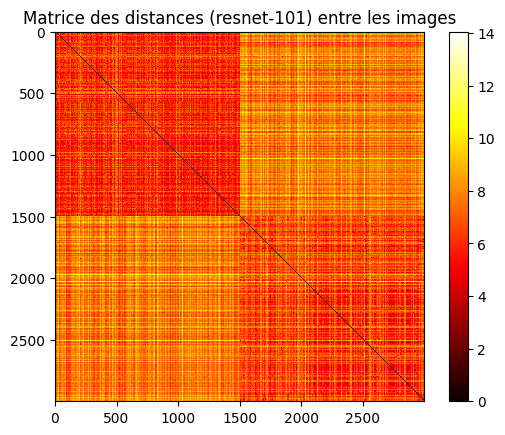

In [9]:
distance_matrix = compute_distance_matrix(images, extract_resnet101_features)

display_distance_matrix(distance_matrix, "Matrice des distances (resnet-101) entre les images")

C:\Users\Antoine BOURGEOIS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Antoine BOURGEOIS\.cache\huggingface\hub\models--timm--inception_v3.tv_in1k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message

Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]
Error processing image: output with shape [1, 224, 224] doesn't match the broadcast shape [3, 224, 224]


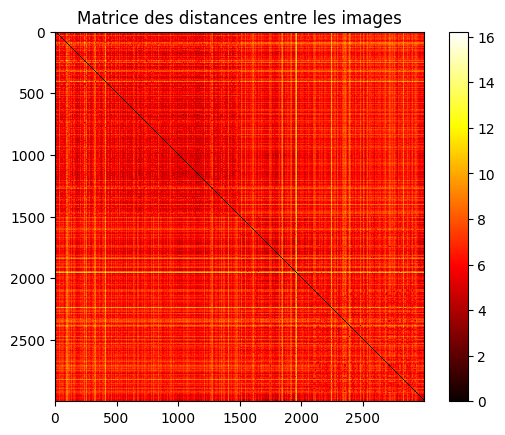

In [22]:
distance_matrix = compute_distance_matrix(images, extract_inceptionV3_features)

display_distance_matrix(distance_matrix, "Matrice des distances (inceptionV3) entre les images")

<h1> Preparing the data for classification:

<h3>"openai/clip-vit-base-patch16"

In [50]:
import torch
from transformers import CLIPModel, CLIPProcessor
import numpy as np
import pandas as pd
from PIL import Image

In [2]:

def extract_clip_features(img):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
    model.eval()  
    model.to(device)  

    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()} 

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)

    features = features.squeeze(0).cpu().numpy()
    return features


In [3]:
def preprocess_image(img):
    # Ensure the image is in RGB format
    if len(img.shape) == 2:  # If it's grayscale (2D)
        img = np.stack([img] * 3, axis=-1)  # Convert to RGB by duplicating the channels
    elif img.shape[2] == 1:  # If it's single channel (like RGBA with alpha channel)
        img = np.repeat(img, 3, axis=-1)  # Convert to 3 channels
    return Image.fromarray(img)

<h2>Train data csv

In [ ]:
food_train_directory = 'archive/training/food'
non_food_train_directory = 'archive/training/non_food'

food_train_image_paths = [os.path.join(food_train_directory, filename) for filename in os.listdir(food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_train_images = [io.imread(image_path) for image_path in food_train_image_paths]

non_food_train_image_paths = [os.path.join(non_food_train_directory, filename) for filename in os.listdir(non_food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_train_images = [io.imread(image_path) for image_path in non_food_train_image_paths]

train_image_paths = food_train_image_paths + non_food_train_image_paths
train_images = food_train_images + non_food_train_images


In [9]:
image_data = []

for image_path, img, label in zip(train_image_paths, train_images, 
                                  ['food'] * len(food_train_images) + ['non_food'] * len(non_food_train_images)):
    img_prep = preprocess_image(img) 
    features = extract_clip_features(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

# Save features to CSV
columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('train_clip_features.csv', index=False)

print("Features saved to train_clip_features.csv")


Features saved to train_clip_features.csv


<h2>evaluation data csv

In [5]:
food_evaluation_directory = 'archive/evaluation/food'
non_food_evaluation_directory = 'archive/evaluation/non_food'

food_evaluation_image_paths = [os.path.join(food_evaluation_directory, filename) for filename in os.listdir(food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_evaluation_images = [io.imread(image_path) for image_path in food_evaluation_image_paths]

non_food_evaluation_image_paths = [os.path.join(non_food_evaluation_directory, filename) for filename in os.listdir(non_food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_evaluation_images = [io.imread(image_path) for image_path in non_food_evaluation_image_paths]

evaluation_image_paths = food_evaluation_image_paths + non_food_evaluation_image_paths
evaluation_images = food_evaluation_images + non_food_evaluation_images


In [ ]:
image_data = []

for image_path, img, label in zip(evaluation_image_paths, evaluation_images, 
                                  ['food'] * len(food_evaluation_images) + ['non_food'] * len(non_food_evaluation_images)):
    img_prep = preprocess_image(img)  
    features = extract_clip_features(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('evaluation_clip_features.csv', index=False)

print("Features saved to evaluation_clip_features.csv")


/home/benk/anaconda3/envs/ML/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Features saved to evaluation_clip_features.csv


<h2>validation data csv

In [7]:
food_validation_directory = 'archive/validation/food'
non_food_validation_directory = 'archive/validation/non_food'

food_validation_image_paths = [os.path.join(food_validation_directory, filename) for filename in os.listdir(food_validation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_validation_images = [io.imread(image_path) for image_path in food_validation_image_paths]

non_food_validation_image_paths = [os.path.join(non_food_validation_directory, filename) for filename in os.listdir(non_food_validation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_validation_images = [io.imread(image_path) for image_path in non_food_validation_image_paths]

validation_image_paths = food_validation_image_paths + non_food_validation_image_paths
validation_images = food_validation_images + non_food_validation_images


In [ ]:
image_data = []

for image_path, img, label in zip(validation_image_paths, validation_images, 
                                  ['food'] * len(food_validation_images) + ['non_food'] * len(non_food_validation_images)):
    img_prep = preprocess_image(img)  
    features = extract_clip_features(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('validation_clip_features.csv', index=False)

print("Features saved to validation_clip_features.csv")


Features saved to validation_clip_features.csv


<h2>Loading the data

In [118]:
train_df = pd.read_csv("train_clip_features.csv")
# val_df = pd.read_csv("validation_clip_features.csv")
test_df = pd.read_csv("evaluation_clip_features.csv")


X_train, y_train = train_df.iloc[:, 2:], train_df["label"]
# X_val, y_val = val_df.iloc[:, 2:], val_df["label"]
X_test, y_test = test_df.iloc[:, 2:], test_df["label"]

<h2>Model

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

<h3>Naive Bayes

In [120]:
nb = GaussianNB()
nb.fit(X_train, y_train)
nb_train_preds = nb.predict(X_train)
nb_test_preds = nb.predict(X_test)

In [121]:
print("Train Accuracy:", accuracy_score(y_train, nb_train_preds))
print("Test Accuracy:", accuracy_score(y_test, nb_test_preds))

Train Accuracy: 0.9866666666666667
Test Accuracy: 0.98


In [122]:
print(classification_report(y_test, nb_test_preds,))

              precision    recall  f1-score   support

        food       1.00      0.96      0.98       500
    non_food       0.96      1.00      0.98       500

    accuracy                           0.98      1000
   macro avg       0.98      0.98      0.98      1000
weighted avg       0.98      0.98      0.98      1000



In [123]:
print(confusion_matrix(y_test, nb_test_preds))

[[480  20]
 [  0 500]]


<h3>cas d'erreurs

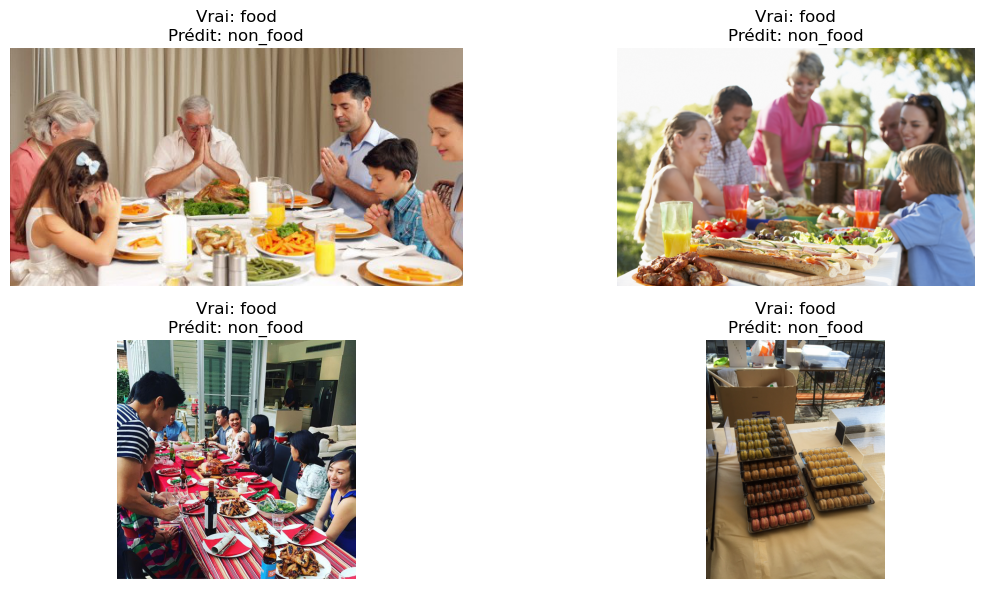

In [124]:
error_indices = np.where(nb_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = nb_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()

<h3>KNN

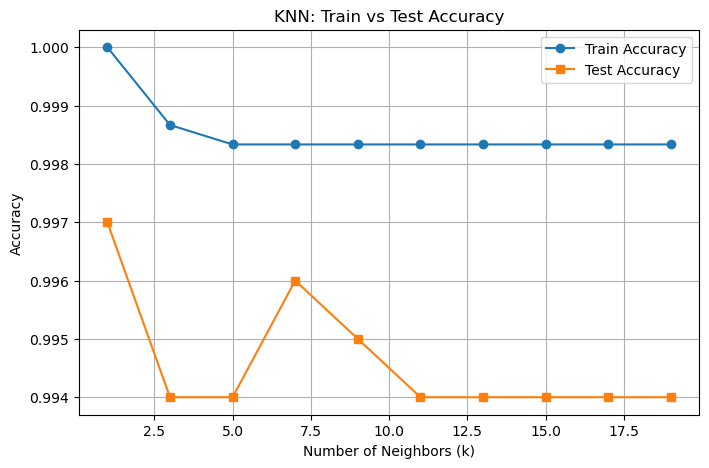

In [125]:
k_values = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]

train_accuracies = []
test_accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    
    train_preds = knn.predict(X_train)
    test_preds = knn.predict(X_test)
    
    train_acc = accuracy_score(y_train, train_preds)
    test_acc = accuracy_score(y_test, test_preds)
    
    train_accuracies.append(train_acc)
    test_accuracies.append(test_acc)

plt.figure(figsize=(8, 5))
plt.plot(k_values, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(k_values, test_accuracies, marker='s', label='Test Accuracy')
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN: Train vs Test Accuracy")
plt.legend()
plt.grid()
plt.show()

In [126]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)
knn_train_preds = knn.predict(X_train)
knn_test_preds = knn.predict(X_test)

In [127]:
print("Train Accuracy:", accuracy_score(y_train, knn_train_preds))
print("Test Accuracy:", accuracy_score(y_test, knn_test_preds))

Train Accuracy: 0.9983333333333333
Test Accuracy: 0.996


In [128]:
print(classification_report(y_test, knn_test_preds))

              precision    recall  f1-score   support

        food       1.00      0.99      1.00       500
    non_food       0.99      1.00      1.00       500

    accuracy                           1.00      1000
   macro avg       1.00      1.00      1.00      1000
weighted avg       1.00      1.00      1.00      1000



In [129]:
print(confusion_matrix(y_test, knn_test_preds))

[[496   4]
 [  0 500]]


<h3>cas d'erreurs

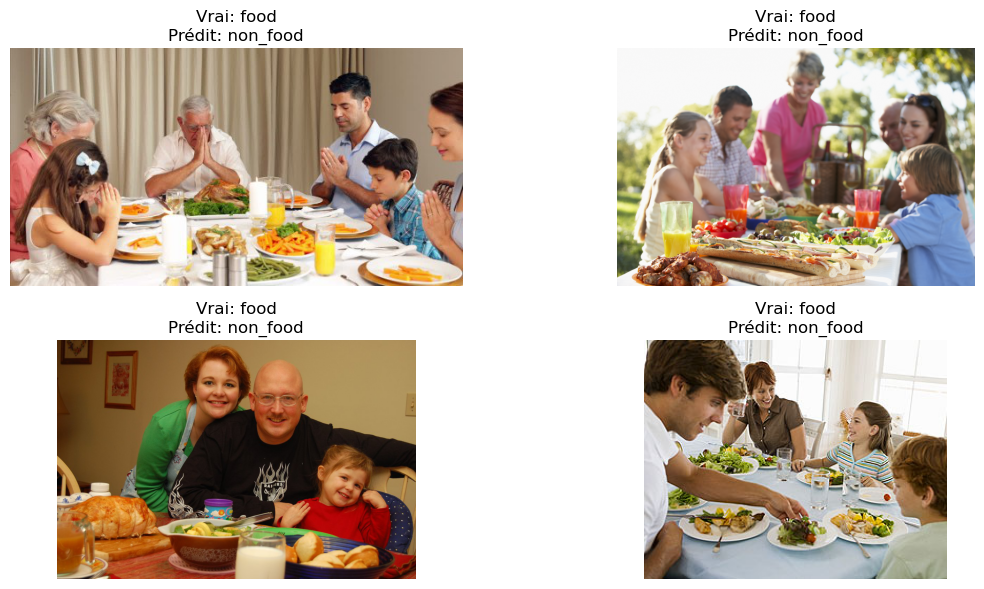

In [130]:
error_indices = np.where(knn_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = knn_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()

<h3>HOG

In [51]:
import os
from skimage import io

In [55]:
def extract_hog(image):
    if isinstance(image, Image.Image):  
        image = np.array(image)
    
    image_resized = resize(image, (28, 28), anti_aliasing=True)

    if len(image_resized.shape) == 3:
        image_gray = cv2.cvtColor((image_resized * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    else:
        image_gray = (image_resized * 255).astype(np.uint8)
    
    hog_features, _ = hog(
        image_gray, 
        pixels_per_cell=(8, 8), 
        cells_per_block=(2, 2), 
        visualize=True
    )
    
    return hog_features


In [56]:
def preprocess_image(img):
    # Ensure the image is in RGB format
    if len(img.shape) == 2:  # If it's grayscale (2D)
        img = np.stack([img] * 3, axis=-1)  # Convert to RGB by duplicating the channels
    elif img.shape[2] == 1:  # If it's single channel (like RGBA with alpha channel)
        img = np.repeat(img, 3, axis=-1)  # Convert to 3 channels
    return Image.fromarray(img)

<h2>Train data csv

In [44]:
food_train_directory = 'archive/training/food'
non_food_train_directory = 'archive/training/non_food'

food_train_image_paths = [os.path.join(food_train_directory, filename) for filename in os.listdir(food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_train_images = [io.imread(image_path) for image_path in food_train_image_paths]

non_food_train_image_paths = [os.path.join(non_food_train_directory, filename) for filename in os.listdir(non_food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_train_images = [io.imread(image_path) for image_path in non_food_train_image_paths]

train_image_paths = food_train_image_paths + non_food_train_image_paths
train_images = food_train_images + non_food_train_images


In [57]:
image_data = []

for image_path, img, label in zip(train_image_paths, train_images, 
                                  ['food'] * len(food_train_images) + ['non_food'] * len(non_food_train_images)):
    img_prep = preprocess_image(img) 
    features = extract_hog(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

# Save features to CSV
columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('train_HOG_features.csv', index=False)

print("Features saved to train_HOG_features.csv")


Features saved to train_HOG_features.csv


<h2>evaluation data csv

In [58]:
food_evaluation_directory = 'archive/evaluation/food'
non_food_evaluation_directory = 'archive/evaluation/non_food'

food_evaluation_image_paths = [os.path.join(food_evaluation_directory, filename) for filename in os.listdir(food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_evaluation_images = [io.imread(image_path) for image_path in food_evaluation_image_paths]

non_food_evaluation_image_paths = [os.path.join(non_food_evaluation_directory, filename) for filename in os.listdir(non_food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_evaluation_images = [io.imread(image_path) for image_path in non_food_evaluation_image_paths]

evaluation_image_paths = food_evaluation_image_paths + non_food_evaluation_image_paths
evaluation_images = food_evaluation_images + non_food_evaluation_images


In [59]:
image_data = []

for image_path, img, label in zip(evaluation_image_paths, evaluation_images, 
                                  ['food'] * len(food_evaluation_images) + ['non_food'] * len(non_food_evaluation_images)):
    img_prep = preprocess_image(img)  
    features = extract_hog(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('evaluation_HOG_features.csv', index=False)

print("Features saved to evaluation_HOG_features.csv")


Features saved to evaluation_HOG_features.csv


<h2>Loading the data

In [131]:
train_df = pd.read_csv("train_HOG_features.csv")
# val_df = pd.read_csv("validation_clip_features.csv")
test_df = pd.read_csv("evaluation_HOG_features.csv")


X_train, y_train = train_df.iloc[:, 2:], train_df["label"]
# X_val, y_val = val_df.iloc[:, 2:], val_df["label"]
X_test, y_test = test_df.iloc[:, 2:], test_df["label"]

<h2>Models

In [132]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

<h3>Naive Bayes

In [133]:
nb = GaussianNB()
nb.fit(X_train, y_train)
nb_train_preds = nb.predict(X_train)
nb_test_preds = nb.predict(X_test)

In [134]:
print("Train Accuracy:", accuracy_score(y_train, nb_train_preds))
print("Test Accuracy:", accuracy_score(y_test, nb_test_preds))

Train Accuracy: 0.7403333333333333
Test Accuracy: 0.745


In [135]:
print(classification_report(y_test, nb_test_preds,))

              precision    recall  f1-score   support

        food       0.74      0.76      0.75       500
    non_food       0.75      0.73      0.74       500

    accuracy                           0.74      1000
   macro avg       0.75      0.74      0.74      1000
weighted avg       0.75      0.74      0.74      1000



In [136]:
print(confusion_matrix(y_test, nb_test_preds))

[[382 118]
 [137 363]]


<h3>cas d'erreurs

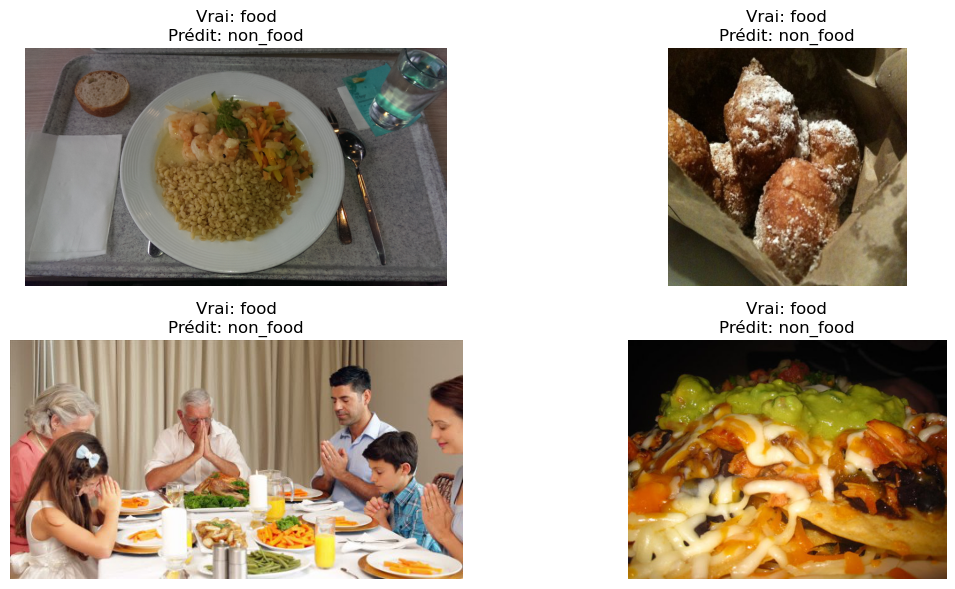

In [137]:
error_indices = np.where(nb_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = nb_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()

<h3>KNN

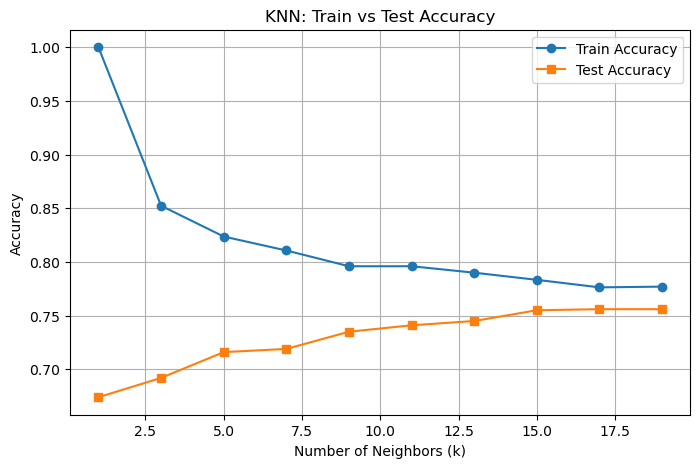

In [138]:
k_values = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]

train_accuracies = []
test_accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    
    train_preds = knn.predict(X_train)
    test_preds = knn.predict(X_test)
    
    train_acc = accuracy_score(y_train, train_preds)
    test_acc = accuracy_score(y_test, test_preds)
    
    train_accuracies.append(train_acc)
    test_accuracies.append(test_acc)

plt.figure(figsize=(8, 5))
plt.plot(k_values, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(k_values, test_accuracies, marker='s', label='Test Accuracy')
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN: Train vs Test Accuracy")
plt.legend()
plt.grid()
plt.show()

In [139]:
knn = KNeighborsClassifier(n_neighbors=17)
knn.fit(X_train, y_train)
knn_train_preds = knn.predict(X_train)
knn_test_preds = knn.predict(X_test)

In [140]:
print("Train Accuracy:", accuracy_score(y_train, knn_train_preds))
print("Test Accuracy:", accuracy_score(y_test, knn_test_preds))

Train Accuracy: 0.7763333333333333
Test Accuracy: 0.756


In [141]:
print(classification_report(y_test, knn_test_preds))

              precision    recall  f1-score   support

        food       0.74      0.80      0.77       500
    non_food       0.78      0.71      0.75       500

    accuracy                           0.76      1000
   macro avg       0.76      0.76      0.76      1000
weighted avg       0.76      0.76      0.76      1000



In [142]:
print(confusion_matrix(y_test, knn_test_preds))

[[399 101]
 [143 357]]


<h3>cas d'erreurs

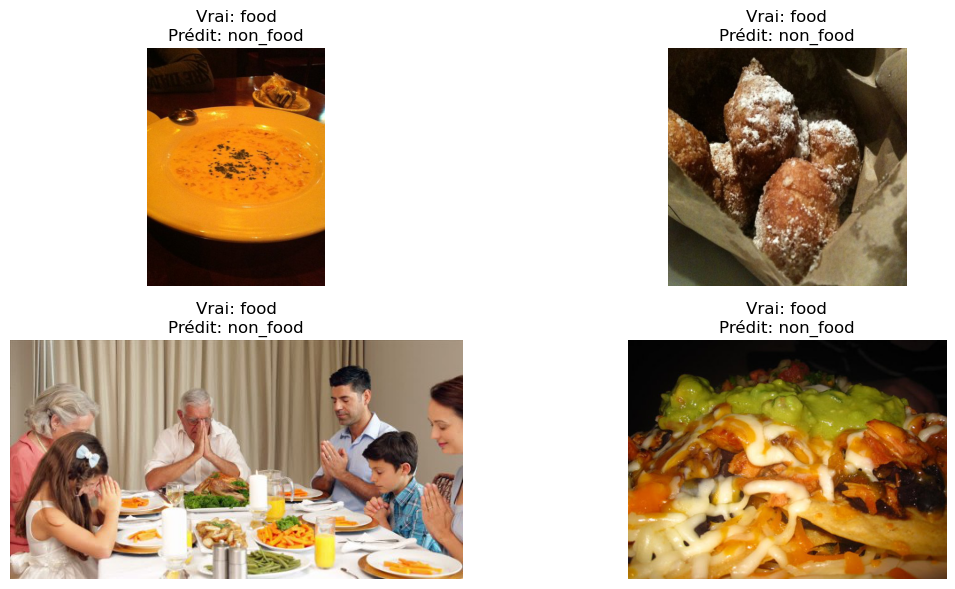

In [143]:
error_indices = np.where(knn_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = knn_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()

<h3>Pixel intensity

In [144]:
def extract_pixel_intensity(image):
    if isinstance(image, Image.Image):  
        image = np.array(image)
    image_resized = resize(image, (28, 28), anti_aliasing=True)
    pixel_intensity = image_resized.mean(axis=(0, 1))  
    return pixel_intensity

In [145]:
def preprocess_image(img):
    if len(img.shape) == 2: 
        img = np.stack([img] * 3, axis=-1)  
    elif img.shape[2] == 1:  
        img = np.repeat(img, 3, axis=-1)  
    return Image.fromarray(img)

In [ ]:
food_train_directory = 'archive/training/food'
non_food_train_directory = 'archive/training/non_food'

food_train_image_paths = [os.path.join(food_train_directory, filename) for filename in os.listdir(food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_train_images = [io.imread(image_path) for image_path in food_train_image_paths]

non_food_train_image_paths = [os.path.join(non_food_train_directory, filename) for filename in os.listdir(non_food_train_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_train_images = [io.imread(image_path) for image_path in non_food_train_image_paths]

train_image_paths = food_train_image_paths + non_food_train_image_paths
train_images = food_train_images + non_food_train_images


In [110]:
image_data = []

for image_path, img, label in zip(train_image_paths, train_images, 
                                  ['food'] * len(food_train_images) + ['non_food'] * len(non_food_train_images)):
    img_prep = preprocess_image(img) 
    features = extract_pixel_intensity(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

# Save features to CSV
columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('train_pixIntensity_features.csv', index=False)

print("Features saved to train_pixIntensity_features.csv")


Features saved to train_pixIntensity_features.csv


In [111]:
food_evaluation_directory = 'archive/evaluation/food'
non_food_evaluation_directory = 'archive/evaluation/non_food'

food_evaluation_image_paths = [os.path.join(food_evaluation_directory, filename) for filename in os.listdir(food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
food_evaluation_images = [io.imread(image_path) for image_path in food_evaluation_image_paths]

non_food_evaluation_image_paths = [os.path.join(non_food_evaluation_directory, filename) for filename in os.listdir(non_food_evaluation_directory) if filename.endswith('.png') or filename.endswith('.jpg')]
non_food_evaluation_images = [io.imread(image_path) for image_path in non_food_evaluation_image_paths]

evaluation_image_paths = food_evaluation_image_paths + non_food_evaluation_image_paths
evaluation_images = food_evaluation_images + non_food_evaluation_images


In [112]:
image_data = []

for image_path, img, label in zip(evaluation_image_paths, evaluation_images, 
                                  ['food'] * len(food_evaluation_images) + ['non_food'] * len(non_food_evaluation_images)):
    img_prep = preprocess_image(img)  
    features = extract_pixel_intensity(img_prep) 
    image_data.append([os.path.basename(image_path), label] + features.tolist())

columns = ['filename', 'label'] + [f'feature_{i}' for i in range(len(image_data[0]) - 2)]
df = pd.DataFrame(image_data, columns=columns)
df.to_csv('evaluation_pixIntensity_features.csv', index=False)

print("Features saved to evaluation_pixIntensity_features.csv")


Features saved to evaluation_pixIntensity_features.csv


In [147]:
train_df = pd.read_csv("train_pixIntensity_features.csv")
# val_df = pd.read_csv("validation_clip_features.csv")
test_df = pd.read_csv("evaluation_pixIntensity_features.csv")


X_train, y_train = train_df.iloc[:, 2:], train_df["label"]
# X_val, y_val = val_df.iloc[:, 2:], val_df["label"]
X_test, y_test = test_df.iloc[:, 2:], test_df["label"]

In [148]:
nb = GaussianNB()
nb.fit(X_train, y_train)
nb_train_preds = nb.predict(X_train)
nb_test_preds = nb.predict(X_test)
print("Train Accuracy:", accuracy_score(y_train, nb_train_preds))
print("Test Accuracy:", accuracy_score(y_test, nb_test_preds))
print(classification_report(y_test, nb_test_preds,))
print(confusion_matrix(y_test, nb_test_preds))

Train Accuracy: 0.668
Test Accuracy: 0.666
              precision    recall  f1-score   support

        food       0.64      0.76      0.69       500
    non_food       0.70      0.57      0.63       500

    accuracy                           0.67      1000
   macro avg       0.67      0.67      0.66      1000
weighted avg       0.67      0.67      0.66      1000

[[379 121]
 [213 287]]


<h3>cas d'erreur

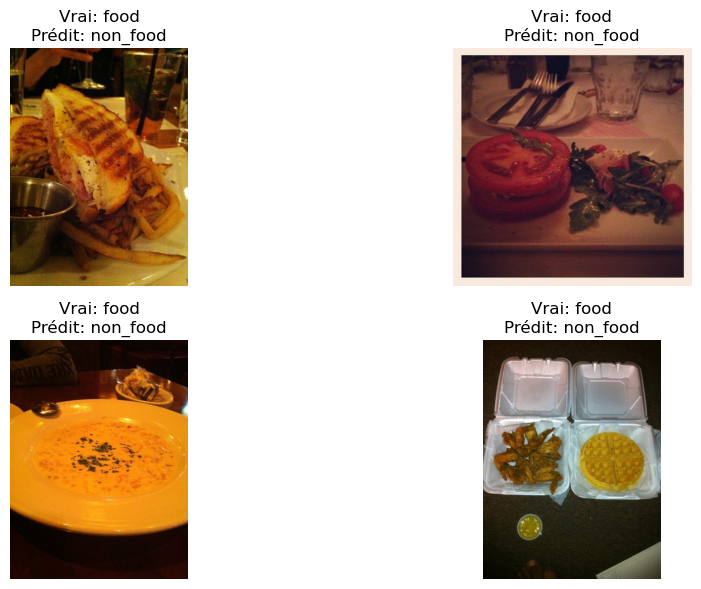

In [149]:
error_indices = np.where(nb_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = nb_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()

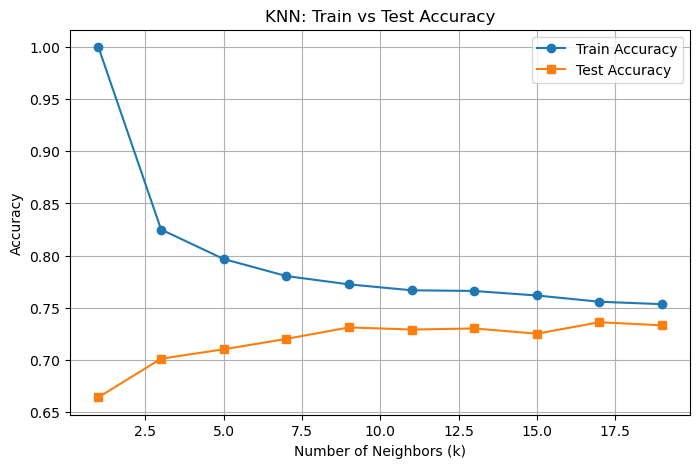

In [150]:
k_values = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]

train_accuracies = []
test_accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    
    train_preds = knn.predict(X_train)
    test_preds = knn.predict(X_test)
    
    train_acc = accuracy_score(y_train, train_preds)
    test_acc = accuracy_score(y_test, test_preds)
    
    train_accuracies.append(train_acc)
    test_accuracies.append(test_acc)

plt.figure(figsize=(8, 5))
plt.plot(k_values, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(k_values, test_accuracies, marker='s', label='Test Accuracy')
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN: Train vs Test Accuracy")
plt.legend()
plt.grid()
plt.show()

In [151]:
knn = KNeighborsClassifier(n_neighbors=17)
knn.fit(X_train, y_train)
knn_train_preds = knn.predict(X_train)
knn_test_preds = knn.predict(X_test)
print("Train Accuracy:", accuracy_score(y_train, knn_train_preds))
print("Test Accuracy:", accuracy_score(y_test, knn_test_preds))
print(classification_report(y_test, knn_test_preds))
print(confusion_matrix(y_test, knn_test_preds))

Train Accuracy: 0.7556666666666667
Test Accuracy: 0.736
              precision    recall  f1-score   support

        food       0.73      0.75      0.74       500
    non_food       0.74      0.72      0.73       500

    accuracy                           0.74      1000
   macro avg       0.74      0.74      0.74      1000
weighted avg       0.74      0.74      0.74      1000

[[374 126]
 [138 362]]


<h3>cas d'erreur

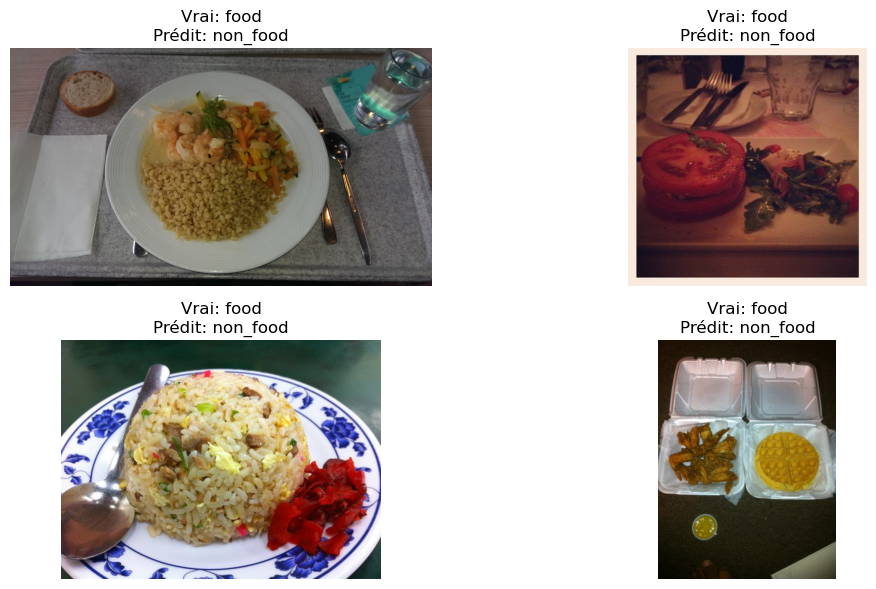

In [152]:
error_indices = np.where(knn_test_preds != y_test)[0]

# Afficher 4 images mal classées
plt.figure(figsize=(12, 6))
for i, idx in enumerate(error_indices[:4]):  # Afficher 4 erreurs
    img = evaluation_images[idx]  # Récupérer l'image originale
    true_label = y_test.iloc[idx]  
    predicted_label = knn_test_preds[idx]  

    plt.subplot(2, 2, i + 1)  # 2 lignes, 2 colonnes
    plt.imshow(img, cmap='gray')  # Supprime cmap='gray' si tes images sont en couleur
    plt.axis("off")
    plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}")

plt.tight_layout()
plt.show()